# Data Exploration

* This notebook creates the image datasets needed for the project
* Also carries out basic EDA




In [1]:
import h5py
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
from helperFunctions import *

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


## Data generation 

In [ ]:
%%script false --no-raise-error #avoid cell execution


# Disable the Matplotlib rcParams deprecation warnings
import sys
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")

#CSV file with OHLC prices
df = dataPrep("../data/asx500_08Nov20.csv")

data_grouped = df.groupby('Symbol')
# for name,group in data_grouped:    
#     print(name + '  ' + str(group['Symbol'].count()))

# Partial processing 
# 200 symbols : 08Nov20
temp = pd.unique(df['Symbol'])[52:200]
data = df[df['Symbol'].isin(temp)]

# data = df[df['Symbol'].isin(['A2M.AX'])] #,'AGL.AX','ALL.AX','ALQ.AX'])]
# data = df

# print(pd.unique(data['Symbol']))

syms = data['Symbol'].unique()
CPU_CORES = mp.cpu_count() * 2
counter = 1
for i in syms:
    print(counter, " : ",i)
    start_time = time.time()
    temp = data[data['Symbol'] == i]    
    result = applyParallel_npsplit(np.array_split(temp,CPU_CORES), createXYarrays)
    gc.collect()
    gc.collect()
    saveXYtoDisk(result,folder="../data/",fname="Set" + str(i))
    print("--- %s seconds ---" % (time.time() - start_time))
    counter += 1

# The process creates images with 3 output classes : DOWN, UP and NO CHANGE. Convert it to UP AND DOWN :
updateYtoBinary(fromFolder='../data/data',toFolder='../data/Train')    


# Created upsampled dataset
upsamplePositives('../data/Test','../data/Test_Upsampled')
upsamplePositives('../data/Train','../data/Train_Upsampled')
upsamplePositives('../data/Validation','../data/Validation_Upsampled')

## Image Samples

(4948, 128, 128, 3)
(4948,)


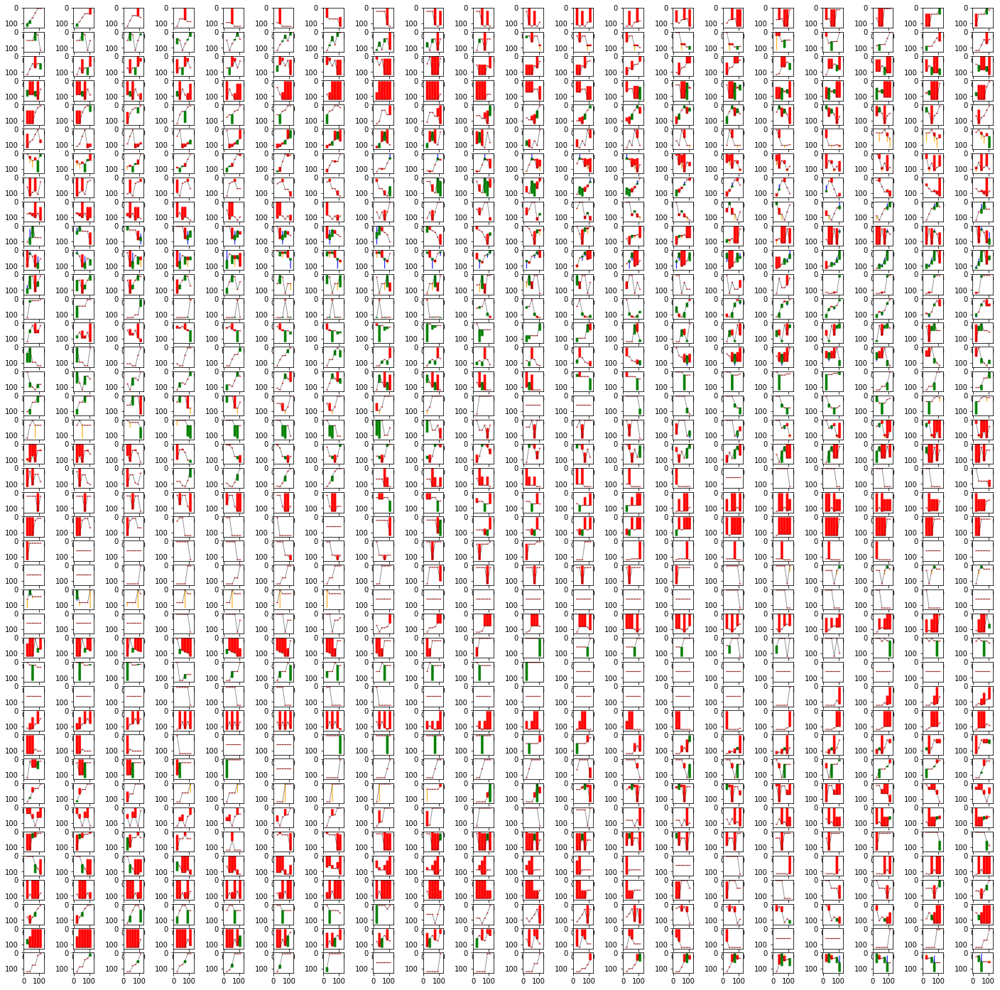

In [13]:
fname = "../data/Validation/SetAIA.AX.h5"

file = h5py.File(fname, "r")
set_x = file["set_x"][:]
set_y = file["set_y"][:]

print(set_x.shape)
print(set_y.shape)


rows = 40
cols = 20
fig, axs = plt.subplots(rows,cols,figsize=(25,25))

for ax,i in zip(np.flip(axs.flatten(),0),range(rows*cols)):
    test = ax.imshow(set_x[i].astype('uint8'))
    # if set_y[i] == 0:
    #     tgt = 'Did not go UP'
    # else:
    #     tgt = 'UP by 2% or more'
    # ax.set_title("Following day : " + tgt)




## Positive Samples

(5117, 128, 128, 3)
(5117,)


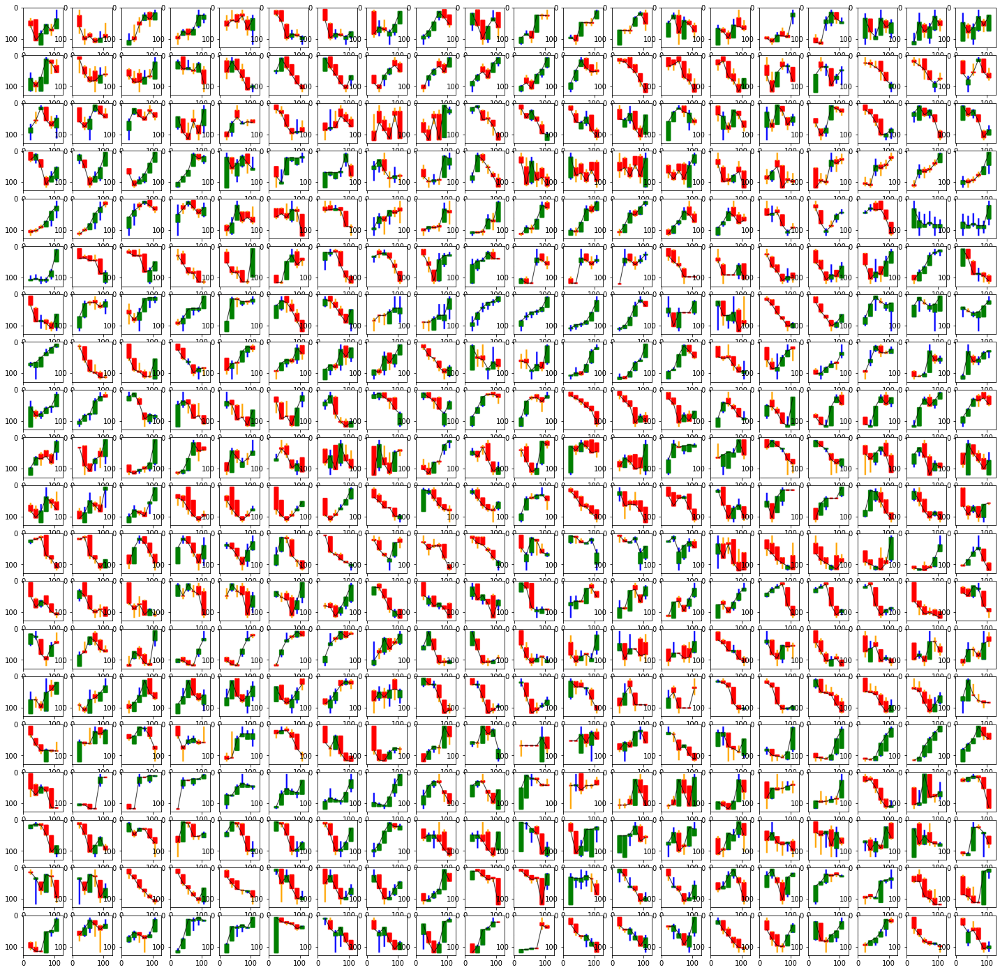

In [25]:
fname = "../data/Train/SetCSL.AX.h5"

file = h5py.File(fname, "r")
set_x = file["set_x"][:]
set_y = file["set_y"][:]

print(set_x.shape)
print(set_y.shape)

set_x = set_x[set_y == 1]

rows = 20
cols = 20
fig, axs = plt.subplots(rows,cols,figsize=(25,25))

for ax,i in zip(np.flip(axs.flatten(),0),range(rows*cols)):
    test = ax.imshow(set_x[i].astype('uint8'))
    # if set_y[i] == 0:
    #     tgt = 'Did not go UP'
    # else:
    #     tgt = 'UP by 2% or more'
    # ax.set_title("Following day : " + tgt)




## Negative Samples

(5117, 128, 128, 3)
(5117,)


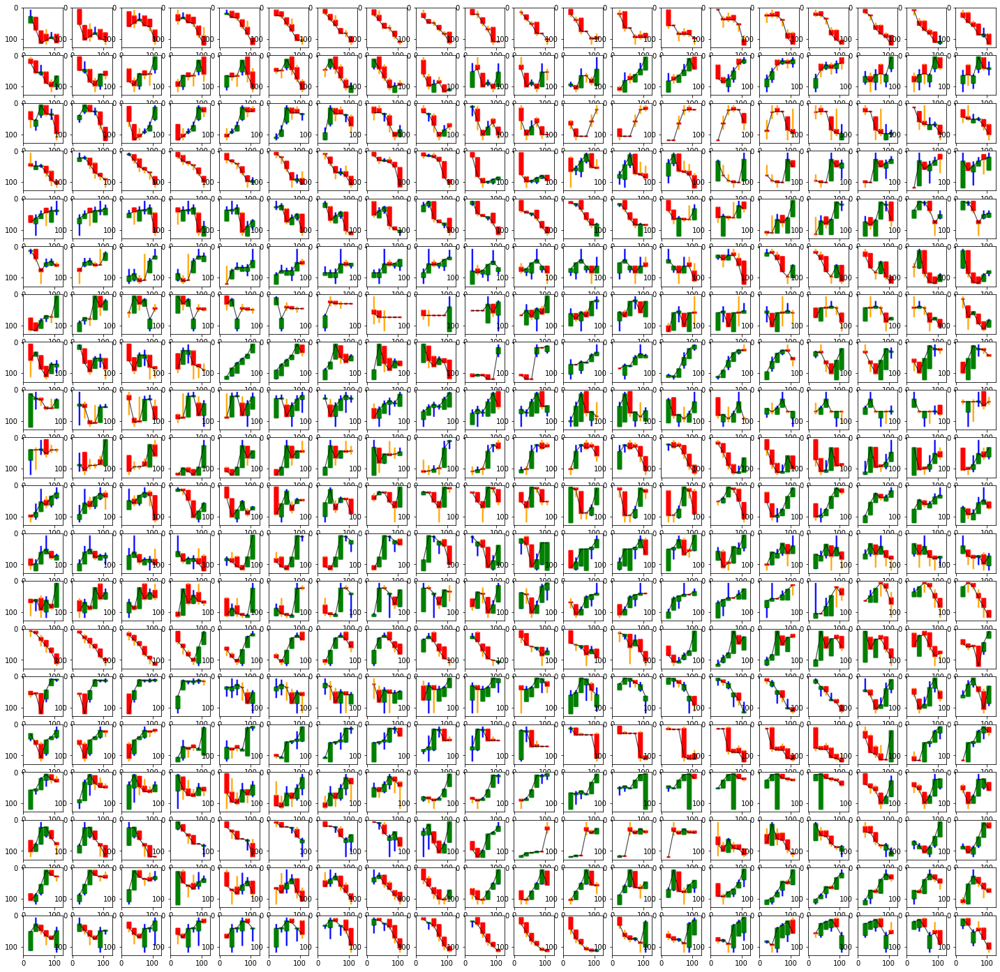

In [22]:
fname = "../data/Train/SetCSL.AX.h5"

file = h5py.File(fname, "r")
set_x = file["set_x"][:]
set_y = file["set_y"][:]

print(set_x.shape)
print(set_y.shape)

set_x = set_x[set_y ==0]

rows = 20
cols = 20
fig, axs = plt.subplots(rows,cols,figsize=(25,25))

for ax,i in zip(np.flip(axs.flatten(),0),range(rows*cols)):
    test = ax.imshow(set_x[i].astype('uint8'))
    # if set_y[i] == 0:
    #     tgt = 'Did not go UP'
    # else:
    #     tgt = 'UP by 2% or more'
    # ax.set_title("Following day : " + tgt)





In [2]:
#CSV file with OHLC prices
df = dataPrep("../data/asx500_08Nov20.csv")

#Keep only top 120 stocks
temp = pd.unique(df['Symbol'])[0:119]
df = df[df['Symbol'].isin(temp)]
df.value_counts('Target')



Target
0    262369
2    120264
1    112989
dtype: int64

In [7]:
# Explore the weird AIA charts
pd.set_option('display.max_rows', 100)
AIA = df[df['Symbol'] == 'AIA.AX'][['Symbol','Date','Open','High','Low','Close']]

AIA['OH'] = AIA['Open']/AIA['High']
AIA['OL'] = AIA['Open']/AIA['Low']
AIA['OC'] = AIA['Open']/AIA['Close']
AIA['HL'] = AIA['High']/AIA['Low']
AIA['HC'] = AIA['High']/AIA['Close']
AIA['LC'] = AIA['Low']/AIA['Close']

AIA
# # AIA[['OH','OL','OC','HL','HC','LC']].std(axis=1)


,Symbol,Date,Open,High,Low,Close,OH,OL,OC,HL,HC,LC
204603,AIA.AX,2000-01-05,0.60880,0.60880,0.60880,0.60880,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
204604,AIA.AX,2000-01-06,0.61389,0.61389,0.59444,0.59444,1.000000,1.032720,1.032720,1.032720,1.032720,1.000000
204605,AIA.AX,2000-01-07,0.60880,0.60880,0.60880,0.60880,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
204606,AIA.AX,2000-01-10,0.60880,0.60880,0.60880,0.60880,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
204607,AIA.AX,2000-01-11,0.63889,0.63889,0.59444,0.59444,1.000000,1.074776,1.074776,1.074776,1.074776,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
209910,AIA.AX,2020-11-02,6.54000,6.58000,6.51000,6.55000,0.993921,1.004608,0.998473,1.010753,1.004580,0.993893
209911,AIA.AX,2020-11-03,6.53000,6.74000,6.53000,6.69000,0.968843,1.000000,0.976084,1.032159,1.007474,0.976084
209912,AIA.AX,2020-11-04,6.69000,6.88000,6.68000,6.73000,0.972384,1.001497,0.994056,1.029940,1.022288,0.992571
209913,AIA.AX,2020-11-05,6.67000,6.71000,6.59000,6.70000,0.994039,1.012140,0.995522,1.018209,1.001493,0.983582


## Target Distribution

In [58]:
def targetData(folder):
    data = np.array([])
    for file in os.listdir(folder):
        if file.endswith(".h5"):
            fname = os.path.join(folder, file)
            file = h5py.File(fname, "r")            
            set_y = file["set_y"][:]

            data = np.append(data,set_y)

            file.close()
    return data


train = targetData('../data/Train')
validation = targetData('../data/Validation')
test = targetData('../data/Test')


np.unique(train, axis=0, return_counts=True)[1] / train.shape[0]
np.unique(validation, axis=0, return_counts=True)[1] / validation.shape[0]
np.unique(test, axis=0, return_counts=True)[1] / test.shape[0]




array([0.75635275, 0.24364725])

array([0.79444835, 0.20555165])

array([0.75519554, 0.24480446])

## Colors

RGB values for the different colors?

White R=255 G=255 B=255  
Red R=255 G=0 B=0  
Blue R=0 G=255 B=0  
Black R=0 G=0 B=0  


## Set X - Histogram of RGB means
* Could be used to identify outliers ?
* **TO DO : Separate RGB and then find their means ?**



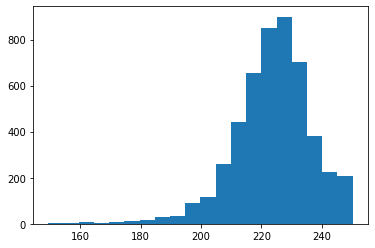

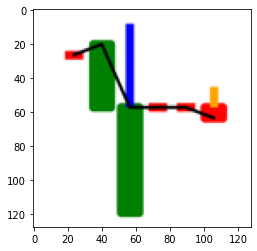

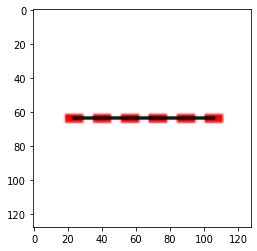

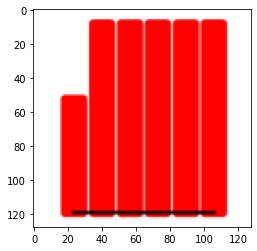

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

(128, 128, 3)

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import h5py
import numpy as np
import matplotlib.pyplot as plt
#fname = "../data/Train/SetA2M.AX.h5"
fname = "../data/Validation/SetAIA.AX.h5"

file = h5py.File(fname, "r")
set_x = file["set_x"][:]
set2D = set_x.reshape(set_x.shape[0],-1)
set2Dmean = np.mean(set2D,1)

n, bins, patches = plt.hist(set2Dmean,bins =20)
plt.show()

#Normal plot
plt.imshow(set_x[np.where([(set2Dmean > 224) & (set2Dmean < 225)])[0][0]].astype('uint8'))
plt.show()

#Extreme plots
plt.imshow(set_x[np.argmax(set2Dmean)].astype('uint8'))
plt.show()
plt.imshow(set_x[np.argmin(set2Dmean)].astype('uint8'))
plt.show()

# # Samples histograms
# from helperFunctions import *
# plotImageHist(20,'../data/Train/')




### Separate channels

In [25]:
np.set_printoptions(precision=0,threshold=np.inf)
image = set_x[np.argmin(set2Dmean)]
image.shape
b, g, r    = image[:, :, 0], image[:, :, 1], image[:, :, 2] # For RGB image

print(b)
# print(g)
# print(r)

(128, 128, 3)

[[255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255]
 [255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 2

## Basic outlier treatment using IQR of RGB mean

3.1% outliers in Train

In [40]:
meanRGB = computeMeanRGB(130,'../data/Train/')

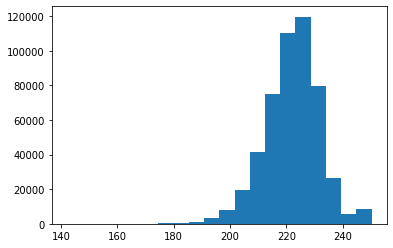

In [41]:
n, bins, patches = plt.hist(meanRGB,bins =20)
plt.show()


In [49]:
q75, q50,q25 = np.percentile(meanRGB, [75 ,50,25])
print(q25)
print(q50)
print(q75)
iqr = q75 - q25

lower_range = q25 - (1.5 * iqr)
upper_range = q75 + (1.5 * iqr)

print(lower_range,' ', upper_range)

meanRGB.shape
meanRGB[(meanRGB < lower_range) | (meanRGB > upper_range)].shape



216.29728190104166
222.7670694986979
228.3876749674479
198.16169230143228   246.52326456705728


(500925,)

(15714,)

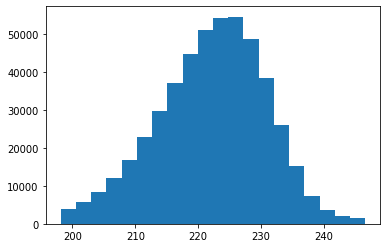

In [55]:
#without outliers
n, bins, patches = plt.hist(meanRGB[(meanRGB > lower_range) & (meanRGB < upper_range)],bins =20)
plt.show()

In [1]:
from helperFunctions import *

LOWER_RANGE = 198.16169230143228   
UPPER_RANGE = 246.52326456705728

cleanOutliers('../data/Test','../data/Test_Clean',LOWER_RANGE,UPPER_RANGE)
cleanOutliers('../data/Train','../data/Train_Clean',LOWER_RANGE,UPPER_RANGE)
cleanOutliers('../data/Validation','../data/Validation_Clean',LOWER_RANGE,UPPER_RANGE)

cleaned
cleaned
cleaned


## See how AIA looks now

(4605, 128, 128, 3)
(4605,)


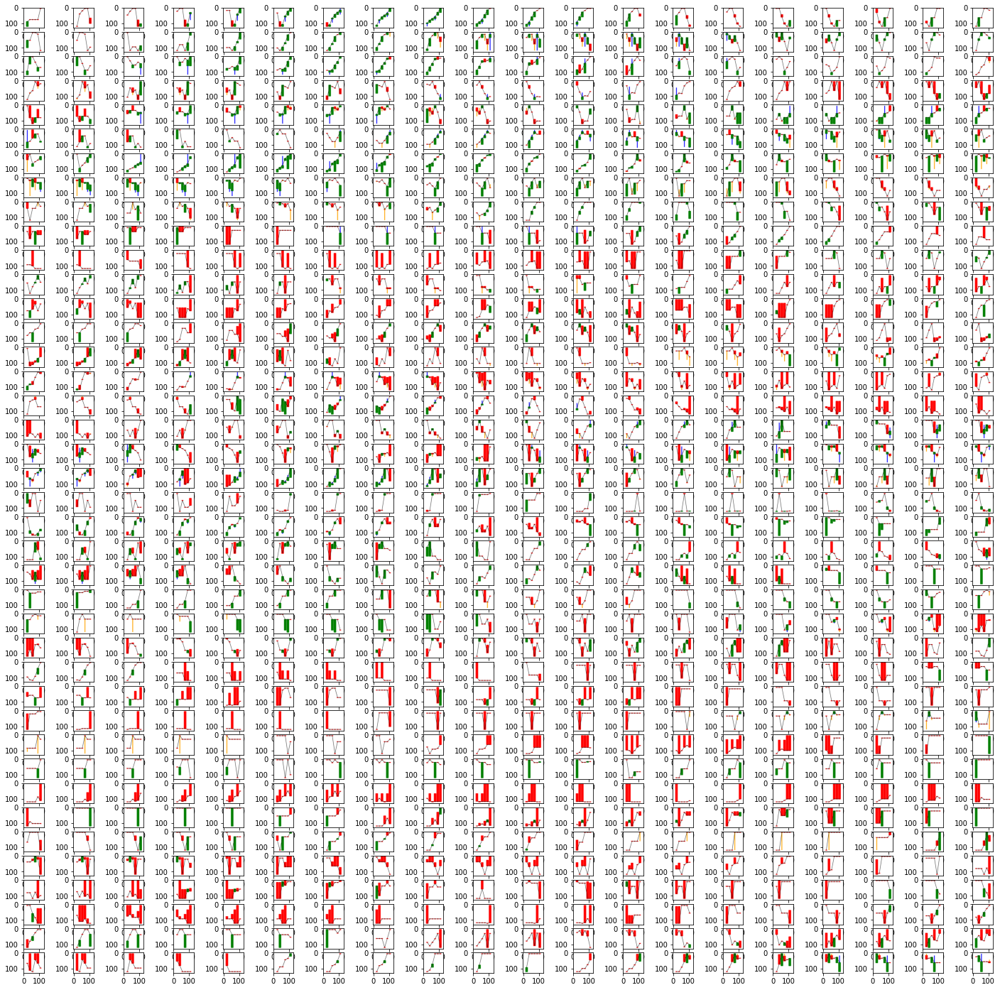

In [3]:
fname = "../data/Validation_Clean/SetAIA.AX_CLEAN.h5"

file = h5py.File(fname, "r")
set_x = file["set_x"][:]
set_y = file["set_y"][:]

print(set_x.shape)
print(set_y.shape)


rows = 40
cols = 20
fig, axs = plt.subplots(rows,cols,figsize=(25,25))

for ax,i in zip(np.flip(axs.flatten(),0),range(rows*cols)):
    test = ax.imshow(set_x[i].astype('uint8'))
    # if set_y[i] == 0:
    #     tgt = 'Did not go UP'
    # else:
    #     tgt = 'UP by 2% or more'
    # ax.set_title("Following day : " + tgt)


